# Lab 1: Pansharpening
 **ISAT, EPITA**
 
 Mauro Dalla Mura
 mauro.dalla-mura@gipsa-lab.grenoble-inp.fr
 


## Information on the lab session

### Introduction
This lab will require you to:
- develop parts of code
- test on images
- analyse the results
- write a report

You can work in groups of two.

### Submission
The report will contain answers to the mandatory questions (**Questions**). There are also some optional questions (**[Optional] Question**) that you can chose to do or not. No need to add images to the report (unless it is necessary for explaining some concepts).

- Submit your work as:
    - Lab report: document in **pdf** of about **2 pages**, no figures, if you answer to optional questions it can be longer than 2 pages.
    - Notebook with the code you developed (you can add the code developed by each person in the group if it is different). The code will not be evaluated but could be checked.
- Put the lab report and code in a compressed folder named: "**ISAT_Lab1_Name1_Name2**"
- Send it by email to **mauro.dalla-mura@gipsa-lab.grenoble-inp.fr** with subject "**[ISAT-Lab1] Name1 Name2**"
- **Deadline 30 November 23:59**

# 1. Introduction

Passive (optical) very high resolution (VHR) satellites are equipped with two sensors acquiring two images of complementary characteristics.
- PAN: Panchromatic image (high spatial resolution, 1 band)
- MS: Multispectral image (low spatial resolution, ~3-16 bands)

This lab session is about **pansharpening**, i.e., the sharpening of a MS using the higher spatial resolution details in the PAN.
This can be seen as a particular problem of data fusion since one would aim at combining in a single product the spatial details resolved by the PAN (but not present in the MS) and the several spectral bands of the MS image (against the single band of the PAN). With respect to the general problem of multisensor fusion, pansharpening could not require the challenging phase of spatial coregistration since typically the images are acquired simultaneously being the PAN and MS sensors both mounted on the same platform.

In this lab session we will use simulated data obtained by degrading the resolution of real acquisitions.
This allows to have both a PAN and MS but also a reference MS (the MS at the original resolution).

## Notation

- $\mathbf{P}$: PAN image
- $\mathbf{M}$: MS image
- $\mathbf{M}^*$: High resolution MS image used as reference for evaluation (in real case scenarios **we don't have this image**)
- $\mathbf{S}$: Result of pansharpening. $\mathbf{S}$ should be as close as possible to $\mathbf{M}^*$

**Note** The original image $\mathbf{M}$ is 4 times smaller than the PAN. In this lab we will consider an image MS that has been already upsampled (e.g., with bicubic interpolation) in order to have the same size of the PAN image.

**Question 1** Write in few lines why is it not possible to obtain images which have both high spectral and high spatial quality?

Les mouvements de la plateforme, la qualité des capteurs, le cout des capteurs mais aussi la bande-passante limité pour communiquer les données au sol ainsi que la quantité de stockage mémoire limité sont des raisons qui expliquent pourquoi il existe un 'trade-off' entre la resolution spatiale et spectrale.

# 1.1 Needed packages

This cells contains all the packages and functions that are needed for executing all the cells of this notebook. Please feel free to add new `import` statements to customize the code and to make new additional experiments. 

In [128]:
import scipy.io
import numpy as np
import matplotlib.pyplot as plt
import matplotlib
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from utils import imshow_stretch

from skimage.metrics import structural_similarity as ssim
from skimage.metrics import mean_squared_error
from skimage import img_as_float


from skimage.color import rgb2hsv, hsv2rgb


# 1.2 Data loading and preparation

Check the size of each image `X` (num rows, num cols, num bands) by typing `X.shape`.


In [129]:
# Load MATLAB .mat file
from scipy.io import loadmat
x = loadmat('./data/Strsbrg1.mat')  # -> You can change dataset here, there are others in the folder

M = x['MS'] # Multispectral image 
HM = x['HRMS'] # High resolution Multispectral image (Reference)
P = x['PAN']  # Panchromatic image

del x

sizeP = P.shape
sizeHM = HM.shape
sizeM = M.shape


print('size M:  ', M.shape)
print(M.dtype)
print(P.dtype)
print('size HM: ', HM.shape)
print('size P:  ', P.shape)

size M:   (1024, 1024, 4)
uint16
uint16
size HM:  (1024, 1024, 4)
size P:   (1024, 1024)


## 1.3 Data visualization

This part of the session is devoted to the visualization and inspection of the images we have.


* Visualize the image data
   * Look at one band of an image `X` with the function `imshow_stretch` (e.g., if you want to see the 3rd band
you should type: `imshow_stretch(X[:,:,2])`
  

\* N.W.: this instruction should be followed by `plt.show()`.

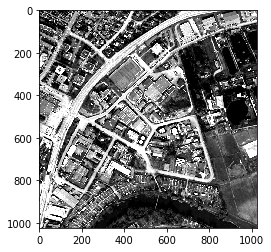

<Figure size 432x288 with 0 Axes>

In [130]:
# PAN
_ = plt.figure
imshow_stretch(P) 
plt.set_cmap('gray')  # warning: permanent!
plt.show()
plt.set_cmap('viridis')  # restore the old colormap for future plots

**Question 2** The MS contains four spectral bands three in the visible domain (centered on the red, green and blue wavelenghts) and one in the near infrared. Show each band separately and try to identify them. Which is the right order of the spectral bands for showing a **true color** image (an image that have "real looking" colors)? Below we have used a sequence (1,2,3) just as an example.

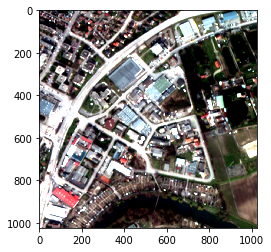

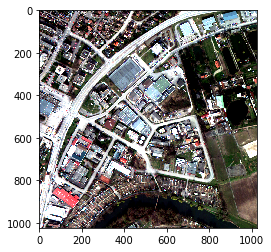

In [131]:
# MS
_ = plt.figure()
imshow_stretch(M[:,:,(2,1,0)]) # -> this is clearly not a "true color" composition

# High res MS -> This is a reference image, usually we don't have it!
_ = plt.figure()
imshow_stretch(HM[:,:,(2,1,0)])

## 1.4 Validation
As we have a reference image HM we can then compare the results obtained by pansharpening with respect to it.
The goal is thus to have an image resulting from pansharpening which is as close as possible to HM.

As quality indexes we will use:
- Minimum Square Error (MSE). Best value 0
- Structure Similarity Index (SSIM). Best value 1

Test the indexes by comparing the MS image **M** and the reference **HM**. This will be a baseline as there is no fusion with the PAN image in this case. Pansharpening should produce images of greater quality (lower MSE and higher SSIM) than this one. 

In [132]:
mse_img = mean_squared_error(M, HM)
ssim_img = ssim(M, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)


MSE: 2970.020
SSIM: 0.757


# 2. Component Substitution
This part of the lab will be devoted to the so-called Component Substitution family of pansharpening techniques.

This family is based on the projection of the MS image into another space, on the substitution of the PAN with one or more components of the transformed image and then on the inverse transform in the original space.

![](./FlowchartCS.png)

## 2.1 Introduction

In more details, considering the MS in matrix format ($\mathbf{M} = \left[\mathbf{M}_1, \dots, \mathbf{M}_N  \right]^T$, with $\mathbf{M}_i$ the i-th channel of the MS in a row vector format) and denoting by $\mathbf{X}$ the MS transformed by a generic linear transformation $A$, the forward transformation can be written as:
\begin{equation}\label{eq:CSforward}
 \mathbf{X} =A\mathbf{M},
\end{equation}

The assumption is that the transformation $A$ separates the spatial structure from the spectral information in different components that are decoupled.  
For example, we can consider the case in which the first component carries the spatial information and this can be considered as a low-pass version of the PAN image ($\mathbf{I}$): $\mathbf{X} = [\mathbf{X_1}, \mathbf{X}_2, \dots \mathbf{X}_{N}]^T$ with $\mathbf{X_1} \approx \mathbf{I}$.
According to this representation, the fusion of the MS with PAN takes place by substituting the components carrying spatial information (in this case, the first component) with the PAN: 
$$\mathbf{Y} = [\mathbf{P}, \mathbf{X}_2, \dots \mathbf{X}_{N}]^T.$$

Then, the inverse transformation is applied on $\mathbf{Y}$ in order to obtain the pansharpened result:
\begin{equation}\label{eq:CSinverse}
\mathbf{S} = A^{-1} \mathbf{Y}.
\end{equation}

## 2.2 An illustrative example on RGB images

One of the first approaches that appeared considered the sharpening of a RGB low resoltuion image using a companion PAN image.

In this case we can consider as transformation $A$ the mapping from the RGB to the HSV color space.
The HSV aims at decoupling the spatial information which is contained in the component Value (V) to the spectral (color) components Hue (H) and Saturation (S).

Implement in the following the Component Substitution scheme presented before and evaluate the results.


In [133]:
def norm_minmax(x, lower, upper):
    """Normalize an array to a given bound interval"""

    x_max = np.max(x)
    x_min = np.min(x)

    m = (upper - lower) / (x_max - x_min)
    x_norm = (m * (x - x_min)) + lower

    return x_norm

def norm_std(x, m, s):
    """Normalize an array in order to have a given mean and std"""
    
    x_norm = s * (x - x.mean(axis=(0,1))) / x.std(axis=(0,1)) + m

    return x_norm

def norm_minmax_img(x, y):
    """Normalize an array to a given bound interval given by image y"""

    y_max = np.max(y)
    y_min = np.min(y)

    x_norm = norm_minmax(x, y_min, y_max)
    return x_norm

def norm_std_img(x, y):
    """Normalize an array in order to have a given mean and std from image y"""

    y_mean = y.mean(axis=(0,1))
    y_std = y.std(axis=(0,1))

    x_norm = norm_std(x, y_mean, y_std)
    return x_norm

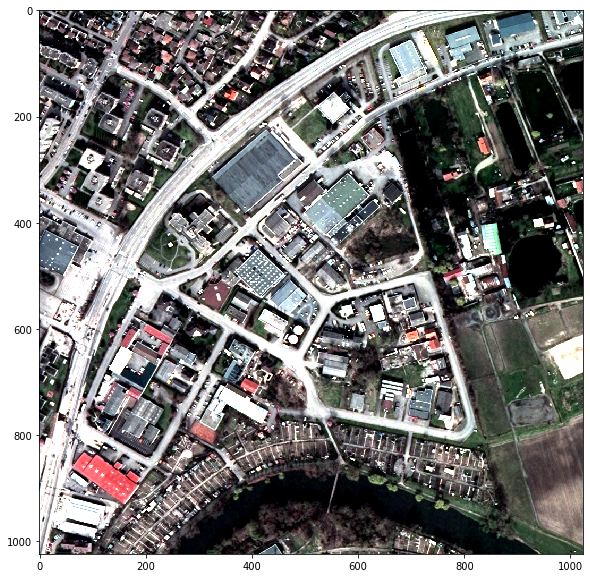

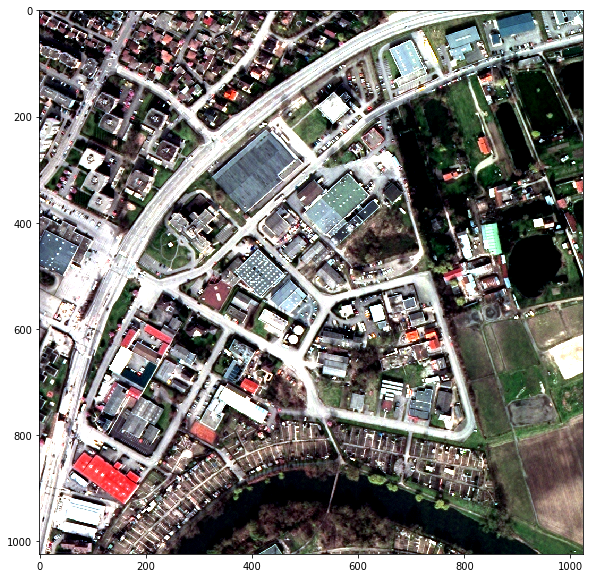

In [134]:
## Component substitution with HSV in a color image
S = M[:,:,(2,1,0)]
S_hsv = rgb2hsv(S)

# -> Your code here
S_hsv[..., 2] = P
S_hr = hsv2rgb(S_hsv)

plt.figure(figsize=(10, 10))
imshow_stretch(S_hr)

S = M[:,:,(2,1,0)]
S_hsv = rgb2hsv(S)

Pn = norm_std_img(P, S_hsv[..., 2])
S_hsv[..., 2] = Pn
S_hrn = hsv2rgb(S_hsv)

plt.figure(figsize=(10, 10))
imshow_stretch(S_hrn)

In [135]:


mse_img = mean_squared_error(S_hr, HM[:,:,(2,1,0)])
ssim_img = ssim(S_hr, HM[:,:,(2,1,0)], data_range=HM.max() - HM.min(),multichannel=True)

print(mse_img)
print(ssim_img)

mse_img = mean_squared_error(S, HM[:,:,(2,1,0)])
ssim_img = ssim(S, HM[:,:,(2,1,0)], data_range=HM.max() - HM.min(),multichannel=True)

print(mse_img)
print(ssim_img)

mse_img = mean_squared_error(S_hrn, HM[:,:,(2,1,0)])
ssim_img = ssim(S_hrn, HM[:,:,(2,1,0)], data_range=HM.max() - HM.min(),multichannel=True)

print(mse_img)
print(ssim_img)

561.6242730355134
0.9478916901653861
1140.9905465443928
0.8150147803176458
57623.525574178435
0.0017604888970448034


## 2.3 Component Substitution in a general formulation


### General formulation
A more general formulation of the CS fusion scheme is given by
\begin{equation}
\mathbf{S}_{k}=\mathbf{M}_{k}+g_{k}\left(
\mathbf{P}-\mathbf{I}\right)  , \label{eq:genaralInjectionModel}%
\end{equation}
in which the subscript $k$ indicates the $k$-th band, $\mathbf{g}=[g_{1},\dots,g_{k}%
,\dots,g_{N}]$ is the vector of the **injection gains**, while, $\mathbf{I}$ is defined as follows:
\begin{equation}
\mathbf{I}= \sum_{i=1}^N w_{i}\mathbf{M}_{i}, \label{eq:linearPLP}%
\end{equation}
where the **weights** $\mathbf{w}=[w_{1},\dots,w_{i},\dots,w_{N}]$ measure the spectral overlap among the spectral bands and the panchromatic
image $\mathbf{P}$.

**[Optional] Question:**

Prove that the process reported above can be equivalently obtained by the component substitution in Sec. 2.1.
Is there an advantage in using this generic formuation with respect the scheme in Sec. 2.1?

**Question** Give a brief comment the meaning of the coefficients $\mathbf{g}$ and $\mathbf{w}$ and their role in the fusion process.

## 2.4 Generalized HSI scheme
You will implement a scheme that is similar to the previous HSV transformation done on the RGB image but with the generalized scheme presented in Sec. 2.3

In particular you will consider that $w_i = 1/N$ for all $i$ and $g_k = 1 $ for all $k$.

MSE: 12501.855
SSIM: 0.658


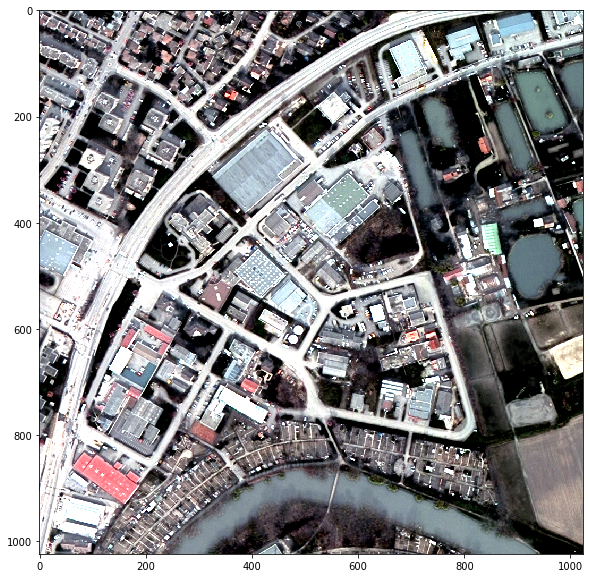

In [136]:
# Write your code here
N = 4
I = (1 / N) * np.sum(M, axis=2)
S = M + np.repeat((P - I)[:, :, np.newaxis], 4, axis=2)

mse_img = mean_squared_error(S, HM)
ssim_img = ssim(S, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)

plt.figure(figsize=(10, 10))
imshow_stretch(S[..., (2,1,0)])

When working with CS techniques, there could be the problem due to the fact that the PAN and the MS images are acquired by different sensors (thus with different dynamics).
Try to perform a normalization of the PAN image in order to force it to have the same dynamic of $\mathbf{I}$. See the normalizatin functions in `utils_ps.py`.

**Question** Compare the case with and without normalization.

MSE: 10030.488
SSIM: 0.722
MSE: 3918.963
SSIM: 0.824


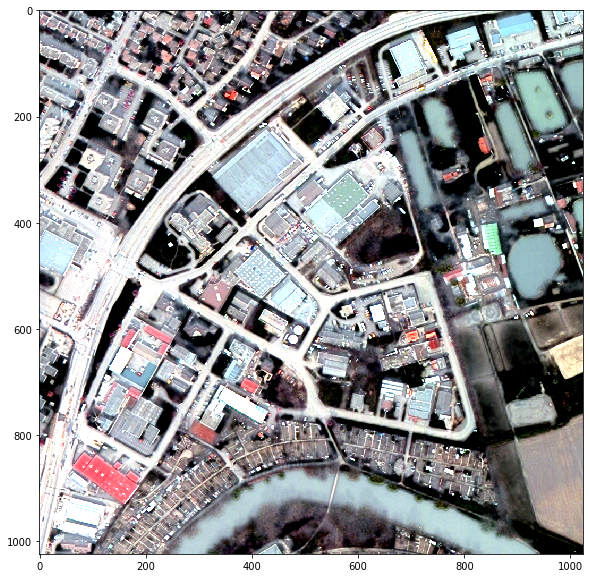

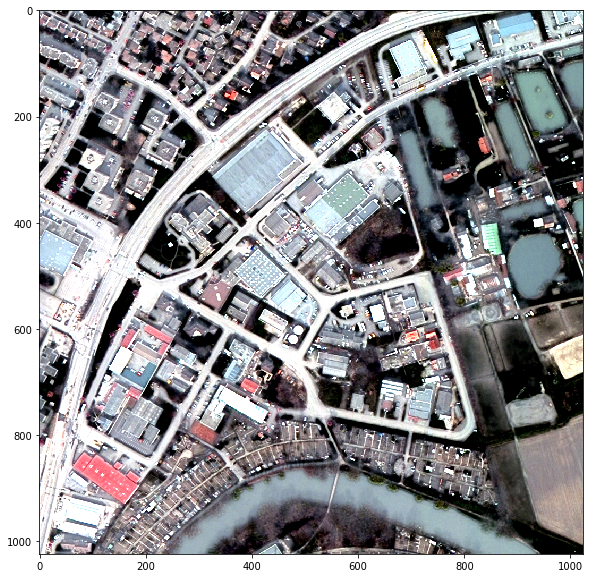

In [137]:
N = 4
I = np.sum((1 / N) * M, axis=2)
Pn = norm_minmax_img(P, I)
S = M + np.repeat((Pn - I)[:, :, np.newaxis], 4, axis=2)

mse_img = mean_squared_error(S, HM)
ssim_img = ssim(S, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)

plt.figure(figsize=(10, 10))
imshow_stretch(S[..., (2,1,0)])

N = 4
I = np.sum((1 / N) * M, axis=2)
Pn = norm_std_img(P, I)
S = M + np.repeat((Pn - I)[:, :, np.newaxis], 4, axis=2)

mse_img = mean_squared_error(S, HM)
ssim_img = ssim(S, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)

plt.figure(figsize=(10, 10))
imshow_stretch(S[..., (2,1,0)])

## 2.5 Multiplicative injection scheme
By replacing the detail injection rule  with a
multiplicative scheme, the Brovey pansharpening approach is obtained. 
The fused image is defined, for $k=1,\dots,N$, as:
\begin{equation}
\mathbf{S}_{k}=\mathbf{M}_{k}\cdot\frac{\mathbf{P}%
}{\mathbf{I}}. \label{eq:HPM}%
\end{equation}
being the operators applied point-wise on the matrices.

**Question** Implement this scheme and compare it with the previous additive injection model.

**[Optional] Question** Prove that this can be equivalently expressed as 
  \begin{equation}
  \mathbf{S}_{k}=\mathbf{M}_{k}+\frac{\mathbf{M}_{k}}{\mathbf{I}}\cdot(\mathbf{P}-\mathbf{I}),
  \end{equation}
 
  by setting, for $k=1,\dots,N$,
  \begin{equation}
  g_{k}=\frac{\mathbf{M}_{k}}{\mathbf{I}}.
  \end{equation}

MSE: 5253.060
SSIM: 0.848


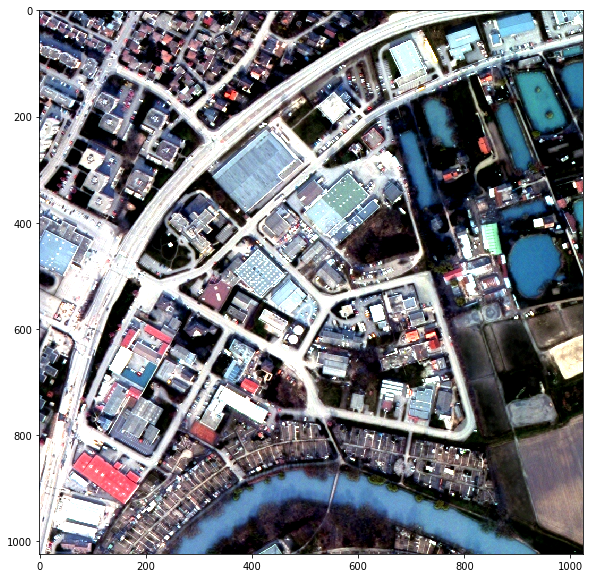

In [138]:
# Your code here
N = 4
I = np.sum((1 / N) * M, axis=2)
Pn = norm_std_img(P, I)
S = np.multiply(M, np.repeat((Pn / I)[:, :, np.newaxis], 4, axis=2))

mse_img = mean_squared_error(S, HM)
ssim_img = ssim(S, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)

plt.figure(figsize=(10, 10))
imshow_stretch(S[..., (2,1,0)])

### MultiResolution Analysis (MRA)

In the second class of pansharpening methods the contribution
of the PAN image to the fused product is achieved by calculating the
difference between $\mathbf{P}$ and a low pass version $\mathbf{P}_{L}$.
Namely the HRMS image is defined as
\begin{equation}
\mathbf{S}_{k}=\mathbf{M}_{k}+g_{k}\left(
\mathbf{P}-\mathbf{P}_{L}\right),\ \forall k=1,\dots,N \label{eq:MRA}%
\end{equation}
This paradigm has been denoted as \textit{Am\'{e}lioration de
la R\'{e}solution Spatiale par Injection de Structures} (\textit{ARSIS})
underlining that the purposes of these methods are the preservation of the
whole content of the LRMS image and the addition of further information
obtained from the PAN image, through spatial filtering.

According to definition the different approaches belonging to
this class are uniquely characterized by the algorithm employed for obtaining
the image $\mathbf{P}_{L}$ and by the combination coefficients $\left\{
g_{k}\right\}_{k=1,\ldots,N}$.

In a very general setting, $\mathbf{P}_{L}$ is achieved through an iterative
decomposition scheme (called MRA) aiming at constructing a sequence of signals with successively
reduced information (or \textit{pyramid}), through the repeated application of
the analysis operators. The type of decomposition constitutes a first
distinguishing feature of the various approaches and can range from very simple
methods based on a single level decomposition to more complex techniques relying upon a multilevel analysis.

In addition, the mathematical expression of $\mathbf{g}$ assumes different
forms in the literature, among which two options are the most commonly reported.
By setting all the coefficients equal to $1$ the \textit{additive} injection scheme is achieved:%
\begin{equation}
\mathbf{S}_{k}=\mathbf{M}_{k}+\left(  \mathbf{P}%
-\mathbf{P}_{L}\right)  ,\ \forall k=1,\dots,N. \label{eq:HPFModel}%
\end{equation}
The \textit{High Pass Modulation} (\textit{HPM}) method (also called \textit{multiplicative} injection scheme) is the other
well-known paradigm, defined through the expression
\begin{equation}
\mathbf{S}_{k}=\mathbf{M}_{k}+\frac{\mathbf{M}_{k}}{\mathbf{P}_{L}}\left(  \mathbf{P}-\mathbf{P}_{L}\right)
,\ \forall k=1,\dots,N, \label{eq:HPMModel}%
\end{equation}
in which the details are weighted by the ratio of the MS and the
PAN low pass version $\mathbf{P}_{L}$, with the aim of reproducing, in the
fused image, the local intensity contrast of the PAN~\cite{vivoneContrast}. 

![](./FlowchartMRA.png)


The flowchart is slightly simpler than for CS. In fact, as one can notice, it lacks the block aimed at estimating the weight vector $\mathbf{w}$, needed for the construction of the equivalent panchromatic image.
Accordingly, the required blocks are devoted to: i) Upsample the MS image to reach the panchromatic resolution; ii) Perform the pyramidal decomposition yielding the low pass version $\mathbf{P}_{L}$ of the PAN image; iii)
Compute the band dependent injection gains $\left\{  g_{k}\right\}
_{k=1,\ldots,N}$; iv) Inject the extracted details.


### Low pass filtering

The most direct implementation of the ARSIS concept consists in applying a
single Linear Time-Invariant (LTI) Low Pass Filter (LPF) $h_{LP}$ to the PAN image $\mathbf{P}$ for obtaining $\mathbf{P}_{L}$, thus resulting in the following formula
\begin{equation}
\mathbf{S}_{k}=\mathbf{M}_{k}+g_k\left(  \mathbf{P}%
-\mathbf{P}\ast h_{LP}\right)  ,\ \forall k=1,\dots,N, \label{eq:HPF2}%
\end{equation}
in which $\ast$ denotes the convolution operator.

This approach can be performed by employing several different
low pass filters $h_{LP}$, among which the most diffused uses Box, Gaussian and Laplacian masks. Furthermore, the simple additive injection scheme  or more elaborated alternatives can be exploited for injecting the spatial details. 

Among the possible couples of filters and coefficients, we chose the simplest scheme achievable by using the Box mask (i.e., mask with uniform weights, implementing an average filter) and additive injection, which leads to the pansharpening algorithm known as \textit{High Pass Filtering} (\textit{HPF}) method. 

The corresponding methodology employing the HPM injection scheme has been proposed in \cite{Liu_SFIM} and is named \textit{Smoothing Filter-based Intensity Modulation} (\textit{SFIM}).

**Question**
- Test the 
- Test the techniques based on Box (average) filter (with additive or multiplicative injection scheme)
- Test different filters (Gaussian, laplacian, median...)


MSE: 1870.227
SSIM: 0.890
MSE: 2935.242
SSIM: 0.886


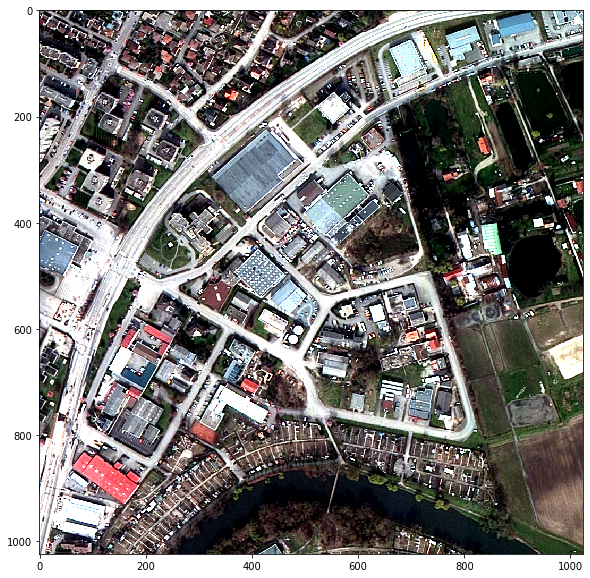

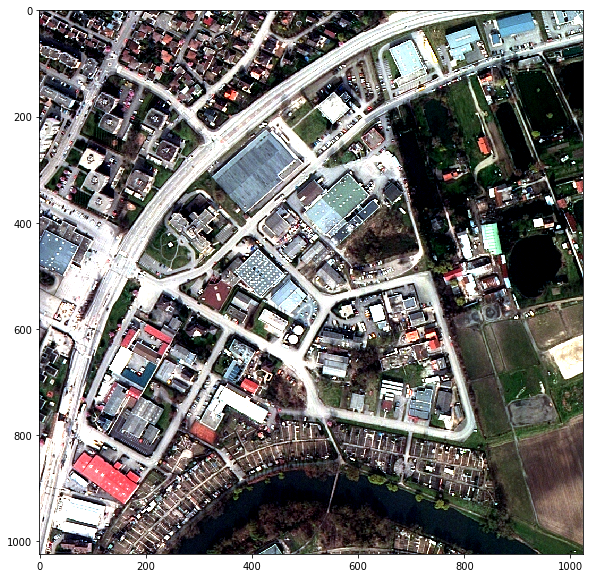

In [139]:
import cv2 as cv

kernel = np.ones((7,7),np.float32)/49
Pl = cv.filter2D(P.astype(np.float32),-1,kernel)

S = M + np.repeat((P.astype(np.float32) - Pl)[:, :, np.newaxis], 4, axis=2)

mse_img = mean_squared_error(S, HM)
ssim_img = ssim(S, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)

plt.figure(figsize=(10, 10))
imshow_stretch(S[..., (2,1,0)])

S = np.zeros(M.shape)
for i in range(4):
    gk = M[:, :, i].astype(np.float32) / Pl
    a = P.astype(np.float32) - Pl
    S[:, :, i] = M[:, :, i] + np.multiply(gk, a)

mse_img = mean_squared_error(S, HM)
ssim_img = ssim(S, HM, data_range=HM.max() - HM.min(),multichannel=True)

print('MSE: %.3f' %mse_img)
print('SSIM: %.3f' %ssim_img)

plt.figure(figsize=(10, 10))
imshow_stretch(S[..., (2,1,0)])